<a href="https://colab.research.google.com/github/victorknox/wordbeach/blob/main/wordcloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [129]:
!pip install requests

# A) Corpus Collection


In [130]:
import requests
from bs4 import BeautifulSoup

# Used bash script to get a list of titles
# ,"Scientific_method", Measurement","International_System_of_Units","Subatomic_particle","Electron","Neutron","Former_Photon","Proton","Former_Quantum_mechanics",Radioactive_decay","Space","Vacuum","Delisted_Thermodynamics","Heat","Temperature","Theory_of_relativity","Speed_of_light","Wave","Delisted_Physics","Energy","Time","Day","Year","Classical_mechanics","Electromagnetic_radiation","Light","Color","Optics","Delisted_Sound","Biology","Life","Delisted_Cell","Death","Suicide","Abiogenesis","Evolution","Mass","Momentum","Motion","Newton's_laws_of_motion","Human_evolution","Failed_candidate_Natural_selection","Force","Electromagnetism","Gravity","Strong_interaction","Weak_interaction","Magnetism","Matter","State_of_matter","Organism","Archaea","Bacteria","Eukaryote","Animal","Zoology","Amphibian","Arthropod","Former_Atom_","Particle_physics","Standard_Model","Delisted_Insect","Bird","Fish","Mammal","Former_Cat","Cattle","Dog","Horse","Primate","Former_Human","Rodent","Reptile","Dinosaur","Plant","Botany","Flower","Seed","Tree","Algae","Fungus","Virus","Anatomy","Human_body","Circulatory_system","Blood","Heart","Lung","Digestion","Liver","Immune_system","Skin","Muscle","Nervous_system","Brain","Ear","Eye","Sense","Skeleton","Ecology","Biodiversity","Ecosystem","Extinction","Genetics","DNA","Former_Gene","Heredity","RNA","Metabolism","Molecular_biology","Start-Class_article_Hormone","Protein","Paleontology","Photosynthesis","Reproduction","Sex","Pregnancy","Sleep","Taxonomy","Species","Chemistry","Biochemistry","Inorganic_chemistry","Organic_chemistry","Physical_chemistry","Chemical_element","Periodic_table","Aluminium","Carbon","Copper","Gold","Hydrogen","Iron","Nitrogen","Oxygen","Phosphorus","Silicon","Failed_candidate_Silver","Sulfur","Start-Class_article_Chemical_compound","Delisted_Water","Delisted_Carbon_dioxide","Chemical_bond","Molecule","Chemical_reaction","Acid–base_reaction","Catalysis","Redox","Metal","Alloy","Bronze","Steel","Earth_science","History_of_Earth","Atmosphere_of_Earth","Structure_of_Earth","Season","Flood","Climate_","Climate_change","Weather","Cloud","Rain","Snow","Tornado","Symbol_question.svg_Former_Tropical_cyclone","Wind","Geology","Earthquake","Erosion","Mineral","Former_Plate_tectonics","Rock","Soil","Delisted_Volcano"
url_list = ["Science","Nature","Astronomy","Universe","Solar_System","Sun","Mercury","Venus","Earth","Moon","Mars","Former_Jupiter","Saturn","Uranus","Neptune","Delisted_Asteroid","Former_Big_Bang","Former_Black_hole","Former_Comet","Galaxy","Milky_Way","Natural_satellite","Orbit","Outer_space","Physical_cosmology","Planet","Star","Supernova"]
print("List of articles: ")
for i in url_list:
  url = "https://en.wikipedia.org/wiki/" + i
  print(i)
  # ping a website or portal for information
  res = requests.get(url)
  html_page = res.content

  soup = BeautifulSoup(html_page, 'html.parser')
  # Python library that is used for web scraping purposes to pull the data out of HTML and XML files
  text = soup.find_all(text=True)

  output = ''
  extractlist = [
      'p',
      'h1',
      'h2',
      'h3',
      'h4',
      'h5',
      'h6',
      'b',
      'a'
  ]

  for t in text:
      if t.parent.name in extractlist:
          output += '{} '.format(t)
    
  # print(output)
  f = open("text.txt", "a")
  f.write(output)
  f.close()

List of articles: 
Science
Nature
Astronomy
Universe
Solar_System
Sun
Mercury
Venus
Earth
Moon
Mars
Former_Jupiter
Saturn
Uranus
Neptune
Delisted_Asteroid
Former_Big_Bang
Former_Black_hole
Former_Comet
Galaxy
Milky_Way
Natural_satellite
Orbit
Outer_space
Physical_cosmology
Planet
Star
Supernova


## Counting the number of sentences


In [131]:
# Opening a file
file = open("text.txt","r")
Counter = 0
  
# Reading from file
Content = file.read()
CoList = Content.split(".")
  
for i in CoList:
    if i:
        Counter += 1
          
print("This is the number of lines in the file")
print(Counter)

This is the number of lines in the file
13904


## Cleaning the text


In [132]:
# cleaning text
import re
# x = re.sub("[^ A-Za-z]", "", x)

x = Content.lower()
# Remove unicode characters
x = x.encode('ascii', 'ignore').decode()
# Remove mentions
x = re.sub("@\S+", " ", x)
# Remove URL
x = re.sub("https*\S+", " ", x)
# Remove Hashtags
x = re.sub("#\S+", " ", x)
# Remove ticks and the next character
x = re.sub("\'\w+", '', x)
# Remove numbers
x = re.sub(r'\w*\d+\w*', '', x)
# Replace the over spaces
x = re.sub('\s{2,}', " ", x)
# print(x)
# Removing punctuations
my_punct = ['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',','.',
           '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', 
           '`', '{', '|', '}', '~', '»', '«', '“', '”']

punct_pattern = re.compile("[" + re.escape("".join(my_punct)) + "]")
x = re.sub(punct_pattern, "", x)
#removing wiki related stop words
stopwords=['bibcode','doi', 'arxiv', 'isbn', 'jump', 'navigation', 'search']
for i in stopwords:
  n=x.replace(i,'')
  x=n

f = open("text.txt", "w")
f.write(x)
f.close()


# B) NLTK Operations

In [133]:
!pip install nltk
import nltk
import matplotlib.pyplot as plt

## Tokenization(Sentences,Tokens)

In [183]:
from nltk.tokenize import word_tokenize
tokens = word_tokenize(x)
print(tokens)


['science', 'to', 'to', 'science', 'disamiguation', 'part', 'of', 'a', 'series', 'on', 'science', 'history', 'literature', 'philosophy', 'scientific', 'method', 'scientist', 'ranches', 'formal', 'natural', 'physical', 'life', 'social', 'applied', 'engineering', 'medical', 'interdisciplinary', 'society', 'communication', 'education', 'funding', 'pseudoscience', 'policy', 'sociology', 'outline', 'portal', 'category', 'universe', 'science', 'from', 'the', 'latin', 'word', 'meaning', 'knowledge', 'is', 'a', 'systematic', 'enterprise', 'that', 'uilds', 'and', 'organizes', 'knowledge', 'in', 'the', 'form', 'of', 'testale', 'explanations', 'and', 'predictions', 'aout', 'the', 'universe', 'the', 'earliest', 'roots', 'of', 'science', 'can', 'e', 'traced', 'to', 'ancient', 'egypt', 'and', 'mesopotamia', 'in', 'around', 'to', 'ce', 'their', 'contriutions', 'to', 'mathematics', 'astronomy', 'and', 'medicine', 'entered', 'and', 'shaped', 'greek', 'natural', 'philosophy', 'of', 'classical', 'antiqui

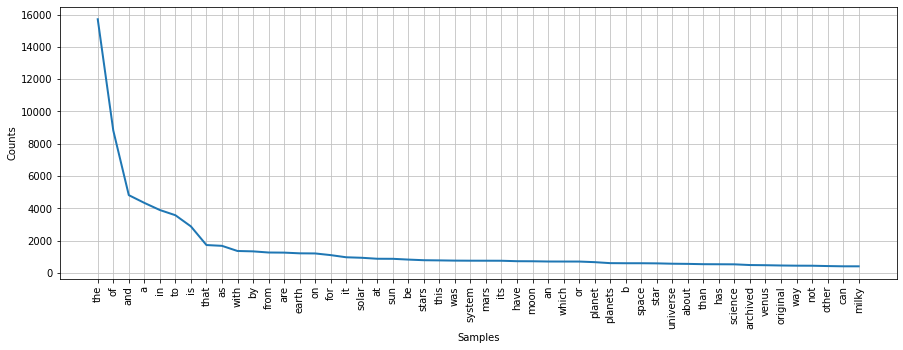

In [135]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(tokens)
fd.plot(50,cumulative=False)

## Removing Stopwords

In [136]:
nltk.download('stopwords')
from nltk.corpus import stopwords

tokens_without_stopwords = []
sr = stopwords.words('english')

for token in tokens:
    if token not in sr:
        tokens_without_stopwords.append(token)

print(tokens_without_stopwords)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
['science', 'science', 'disambiguation', 'part', 'series', 'science', 'history', 'literature', 'philosophy', 'scientific', 'method', 'scientist', 'branches', 'formal', 'natural', 'physical', 'life', 'social', 'applied', 'engineering', 'medical', 'interdisciplinary', 'society', 'communication', 'education', 'funding', 'pseudoscience', 'policy', 'sociology', 'outline', 'portal', 'category', 'universe', 'science', 'latin', 'word', 'meaning', 'knowledge', 'systematic', 'enterprise', 'builds', 'organizes', 'knowledge', 'form', 'testable', 'explanations', 'predictions', 'universe', 'earliest', 'roots', 'science', 'traced', 'ancient', 'egypt', 'mesopotamia', 'around', 'bce', 'contributions', 'mathematics', 'astronomy', 'medicine', 'entered', 'shaped', 'greek', 'natural', 'philosophy', 'classical', 'antiquity', 'whereby', 'formal', 'attempts', 'made', 'provide', 'explanations'

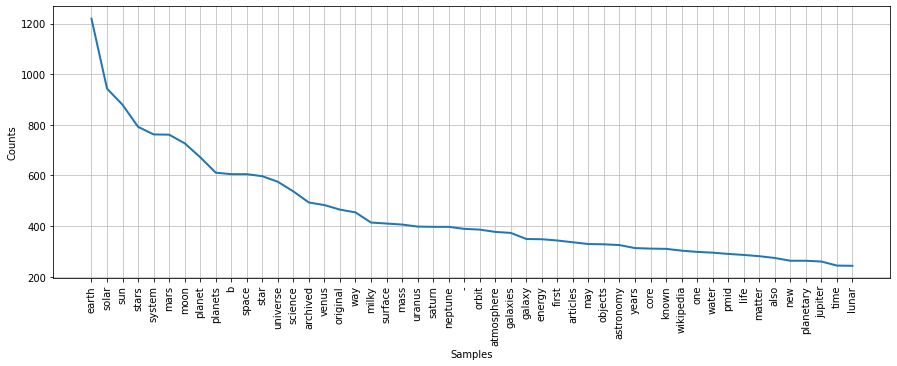

In [138]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(tokens_without_stopwords)
fd.plot(50,cumulative=False)

## POS tagging


In [139]:
nltk.download('averaged_perceptron_tagger')
from nltk import pos_tag
# POS (Parts Of Speech) for: nouns, adjectives, verbs and adverbs
# DI_POS_TYPES = {'NN':'n', 'JJ':'a', 'VB':'v', 'RB':'r'} 
# POS_TYPES = list(DI_POS_TYPES.keys())

pos = nltk.pos_tag(tokens_without_stopwords)
print(pos)

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[('science', 'NN'), ('science', 'NN'), ('disambiguation', 'NN'), ('part', 'NN'), ('series', 'NN'), ('science', 'NN'), ('history', 'NN'), ('literature', 'NN'), ('philosophy', 'NN'), ('scientific', 'JJ'), ('method', 'NN'), ('scientist', 'NN'), ('branches', 'NNS'), ('formal', 'JJ'), ('natural', 'JJ'), ('physical', 'JJ'), ('life', 'NN'), ('social', 'JJ'), ('applied', 'VBD'), ('engineering', 'NN'), ('medical', 'JJ'), ('interdisciplinary', 'JJ'), ('society', 'NN'), ('communication', 'NN'), ('education', 'NN'), ('funding', 'VBG'), ('pseudoscience', 'NN'), ('policy', 'NN'), ('sociology', 'NN'), ('outline', 'VBP'), ('portal', 'JJ'), ('category', 'NN'), ('universe', 'JJ'), ('science', 'NN'), ('latin', 'JJ'), ('word', 'NN'), ('meaning', 'NN'), ('knowledge', 'NN'), ('systematic', 'JJ'), ('enterprise', 'NN'), ('bu

In [140]:
from collections import Counter
counts = Counter( tag for word,  tag in pos)
print(counts)

Counter({'NN': 49742, 'JJ': 33417, 'NNS': 17846, 'VBP': 6500, 'RB': 6388, 'VBD': 5054, 'VBG': 3242, 'VBN': 3197, 'VBZ': 2509, 'IN': 2354, 'CD': 1087, 'VB': 1046, 'MD': 719, 'JJR': 708, ':': 607, 'JJS': 596, 'RBR': 333, 'FW': 271, 'DT': 184, 'NNP': 181, 'SYM': 91, 'PRP': 79, 'CC': 63, 'RP': 47, 'WP$': 29, 'WRB': 21, 'TO': 15, 'EX': 15, 'RBS': 11, 'WP': 10, 'WDT': 6, 'PRP$': 1})


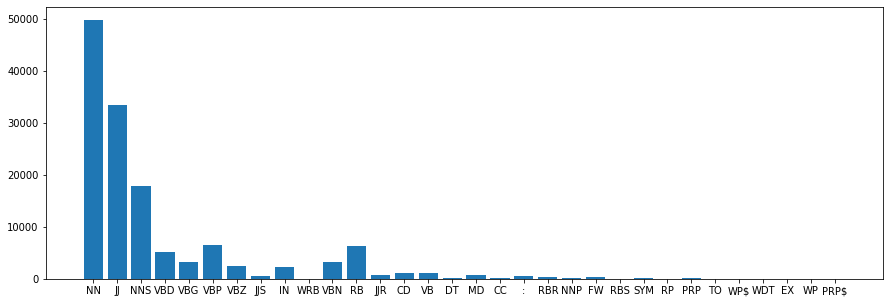

In [141]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 5))

names = list(counts.keys())
values = list(counts.values())

plt.bar(range(len(counts)), values, tick_label=names)
plt.show()

In [142]:
nouns = []
for (a, b) in pos:
  if (b == "NN"):
    nouns.append(a)

print(nouns)

['science', 'science', 'disambiguation', 'part', 'series', 'science', 'history', 'literature', 'philosophy', 'method', 'scientist', 'life', 'engineering', 'society', 'communication', 'education', 'pseudoscience', 'policy', 'sociology', 'category', 'science', 'word', 'meaning', 'knowledge', 'enterprise', 'form', 'science', 'egypt', 'mesopotamia', 'medicine', 'philosophy', 'antiquity', 'world', 'roman', 'empire', 'knowledge', 'world', 'world', 'age', 'recovery', 'assimilation', 'greek', 'century', 'philosophy', 'revolution', 'century', 'method', 'role', 'knowledge', 'century', 'science', 'shape', 'philosophy', 'science', 'science', 'chemistry', 'sense', 'psychology', 'sociology', 'study', 'computer', 'science', 'deal', 'science', 'evidence', 'knowledge', 'engineering', 'medicine', 'knowledge', 'science', 'curiosity', 'world', 'desire', 'solve', 'government', 'impact', 'work', 'emergence', 'science', 'influence', 'enterprise', 'prioritizing', 'development', 'health', 'care', 'infrastructu

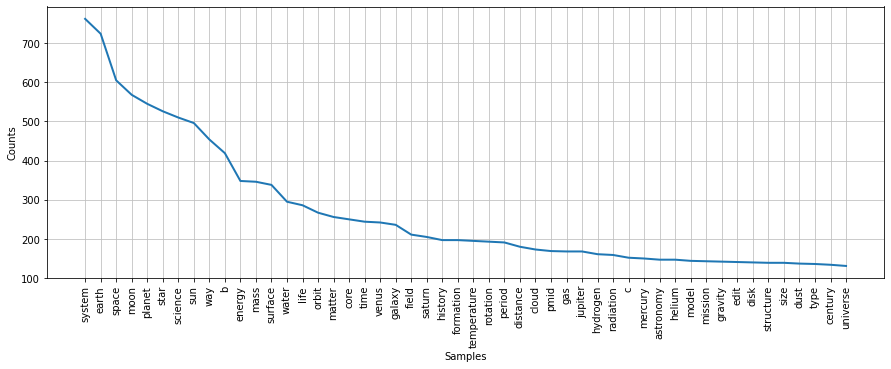

In [143]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(nouns)
fd.plot(50,cumulative=False)

In [144]:
Adj = []
for (a, b) in pos:
  if (b == "JJ"):
    Adj.append(a)

print(Adj)

['scientific', 'formal', 'natural', 'physical', 'social', 'medical', 'interdisciplinary', 'portal', 'universe', 'latin', 'systematic', 'testable', 'universe', 'ancient', 'bce', 'astronomy', 'shaped', 'greek', 'natural', 'classical', 'formal', 'physical', 'natural', 'western', 'greek', 'western', 'early', 'middle', 'muslim', 'islamic', 'golden', 'islamic', 'europe', 'natural', 'scientific', 'new', 'previous', 'greek', 'scientific', 'creation', 'many', 'institutional', 'professional', 'take', 'natural', 'natural', 'modern', 'major', 'natural', 'biology', 'nature', 'social', 'formal', 'logic', 'theoretical', 'formal', 'empirical', 'scientific', 'practical', 'applied', 'new', 'contemporary', 'scientific', 'collaborative', 'academic', 'practical', 'scientific', 'commercial', 'public', 'environmental', 'broad', 'modern', 'many', 'historical', 'modern', 'distinct', 'successful', 'original', 'particular', 'natural', 'recorded', 'complex', 'poisonous', 'edible', 'public', 'national', 'floodplai

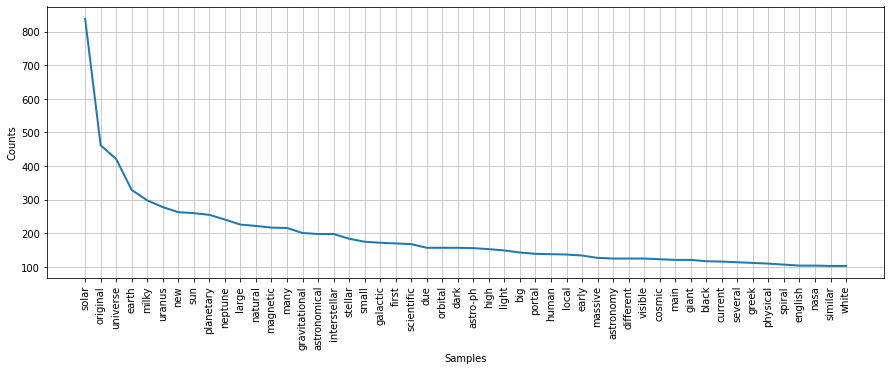

In [145]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(Adj)
fd.plot(50,cumulative=False)

In [146]:
pnouns = []
for (a, b) in pos:
  if (b == "NNS"):
    pnouns.append(a)

print(pnouns)

['branches', 'builds', 'explanations', 'predictions', 'roots', 'contributions', 'mathematics', 'attempts', 'explanations', 'events', 'causes', 'conceptions', 'centuries', 'ages', 'inquiries', 'ideas', 'discoveries', 'conceptions', 'traditions', 'features', 'branches', 'sciences', 'physics', 'sciences', 'economics', 'individuals', 'societies', 'sciences', 'mathematics', 'symbols', 'rules', 'sciences', 'disciplines', 'purposes', 'sciences', 'scientists', 'problems', 'teams', 'institutions', 'agencies', 'companies', 'policies', 'products', 'contents', 'civilizations', 'results', 'defines', 'people', 'things', 'calendars', 'techniques', 'plants', 'reservoirs', 'dikes', 'buildings', 'pyramids', 'things', 'mythologies', 'systems', 'alloys', 'substances', 'cultures', 'livers', 'roots', 'words', 'concepts', 'egyptians', 'mesopotamians', 'contributions', 'mathematics', 'egyptians', 'problems', 'surveyors', 'builders', 'months', 'days', 'days', 'bodies', 'forces', 'spirits', 'treatments', 'thera

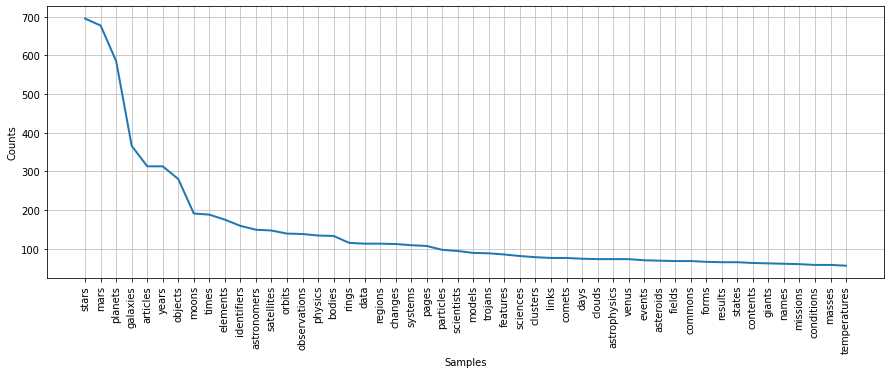

In [147]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(pnouns)
fd.plot(50,cumulative=False)

## Stemming and Lemmatization

In [149]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

# lemmas list of words
lemmas = []

lemmatizer = WordNetLemmatizer()
for word in tokens_without_stopwords:
  lemmas.append(lemmatizer.lemmatize(word))

print(lemmas)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
['science', 'science', 'disambiguation', 'part', 'series', 'science', 'history', 'literature', 'philosophy', 'scientific', 'method', 'scientist', 'branch', 'formal', 'natural', 'physical', 'life', 'social', 'applied', 'engineering', 'medical', 'interdisciplinary', 'society', 'communication', 'education', 'funding', 'pseudoscience', 'policy', 'sociology', 'outline', 'portal', 'category', 'universe', 'science', 'latin', 'word', 'meaning', 'knowledge', 'systematic', 'enterprise', 'build', 'organizes', 'knowledge', 'form', 'testable', 'explanation', 'prediction', 'universe', 'earliest', 'root', 'science', 'traced', 'ancient', 'egypt', 'mesopotamia', 'around', 'bce', 'contribution', 'mathematics', 'astronomy', 'medicine', 'entered', 'shaped', 'greek', 'natural', 'philosophy', 'classical', 'antiquity', 'whereby', 'formal', 'attempt', 'made', 'provide', 'explanation', 'event', 'p

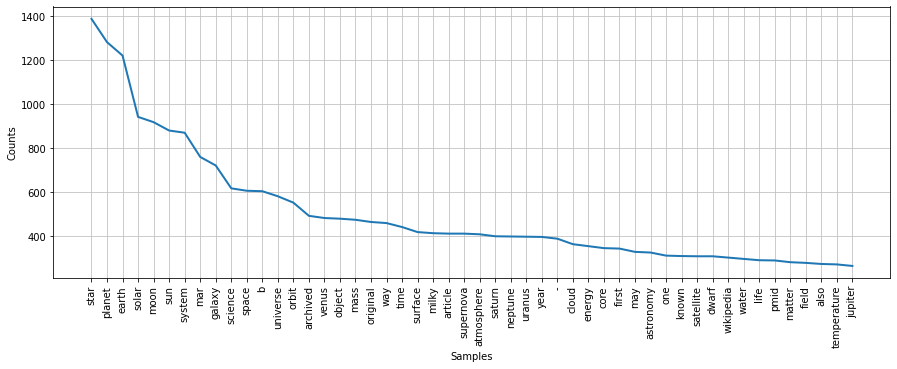

In [150]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(lemmas)
fd.plot(50,cumulative=False)

In [151]:
from nltk.stem import PorterStemmer
stemmer = PorterStemmer()

stems = []
# list of stems
for word in tokens_without_stopwords:
  stems.append(stemmer.stem(word))

print(stems)

['scienc', 'scienc', 'disambigu', 'part', 'seri', 'scienc', 'histori', 'literatur', 'philosophi', 'scientif', 'method', 'scientist', 'branch', 'formal', 'natur', 'physic', 'life', 'social', 'appli', 'engin', 'medic', 'interdisciplinari', 'societi', 'commun', 'educ', 'fund', 'pseudosci', 'polici', 'sociolog', 'outlin', 'portal', 'categori', 'univers', 'scienc', 'latin', 'word', 'mean', 'knowledg', 'systemat', 'enterpris', 'build', 'organ', 'knowledg', 'form', 'testabl', 'explan', 'predict', 'univers', 'earliest', 'root', 'scienc', 'trace', 'ancient', 'egypt', 'mesopotamia', 'around', 'bce', 'contribut', 'mathemat', 'astronomi', 'medicin', 'enter', 'shape', 'greek', 'natur', 'philosophi', 'classic', 'antiqu', 'wherebi', 'formal', 'attempt', 'made', 'provid', 'explan', 'event', 'physic', 'world', 'base', 'natur', 'caus', 'fall', 'western', 'roman', 'empir', 'knowledg', 'greek', 'concept', 'world', 'deterior', 'western', 'europ', 'earli', 'centuri', 'ce', 'middl', 'age', 'preserv', 'muslim

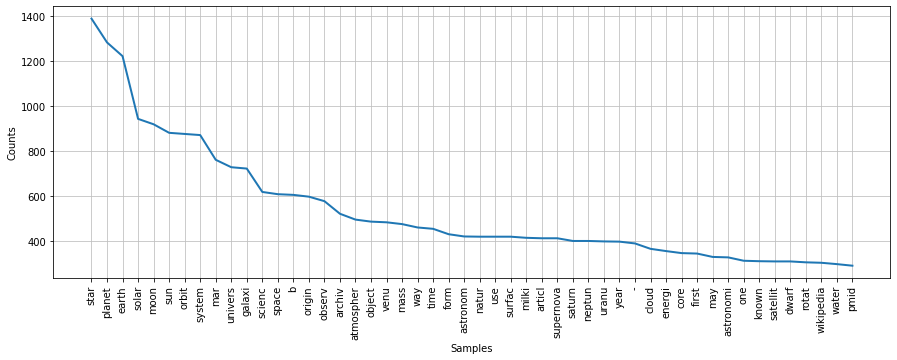

In [152]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(stems)
fd.plot(50,cumulative=False)

# C) Word cloud


## The Algorithm

  1. Lemmatize Adjectives
  2. Combine nouns(plural, singular) and Adjectives(lemmatized) [based on POS tagging]
  3. Pick the top 50 common words among this list 

In [153]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

# lemmas list of words
snouns = []

lemmatizer = WordNetLemmatizer()
for pnoun in pnouns:
  snouns.append(lemmatizer.lemmatize(pnoun))

print(snouns)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
['branch', 'build', 'explanation', 'prediction', 'root', 'contribution', 'mathematics', 'attempt', 'explanation', 'event', 'cause', 'conception', 'century', 'age', 'inquiry', 'idea', 'discovery', 'conception', 'tradition', 'feature', 'branch', 'science', 'physic', 'science', 'economics', 'individual', 'society', 'science', 'mathematics', 'symbol', 'rule', 'science', 'discipline', 'purpose', 'science', 'scientist', 'problem', 'team', 'institution', 'agency', 'company', 'policy', 'product', 'content', 'civilization', 'result', 'defines', 'people', 'thing', 'calendar', 'technique', 'plant', 'reservoir', 'dike', 'building', 'pyramid', 'thing', 'mythology', 'system', 'alloy', 'substance', 'culture', 'liver', 'root', 'word', 'concept', 'egyptian', 'mesopotamians', 'contribution', 'mathematics', 'egyptian', 'problem', 'surveyor', 'builder', 'month', 'day', 'day', 'body', 'force',

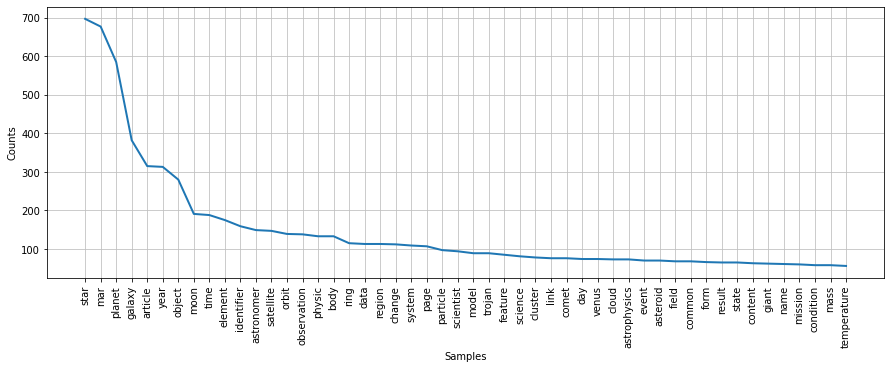

In [154]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(snouns)
fd.plot(50,cumulative=False)

In [155]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

# lemmas list of words
adjnouns = []

lemmatizer = WordNetLemmatizer()
for word in Adj:
  adjnouns.append(lemmatizer.lemmatize(word))

print(adjnouns)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
['scientific', 'formal', 'natural', 'physical', 'social', 'medical', 'interdisciplinary', 'portal', 'universe', 'latin', 'systematic', 'testable', 'universe', 'ancient', 'bce', 'astronomy', 'shaped', 'greek', 'natural', 'classical', 'formal', 'physical', 'natural', 'western', 'greek', 'western', 'early', 'middle', 'muslim', 'islamic', 'golden', 'islamic', 'europe', 'natural', 'scientific', 'new', 'previous', 'greek', 'scientific', 'creation', 'many', 'institutional', 'professional', 'take', 'natural', 'natural', 'modern', 'major', 'natural', 'biology', 'nature', 'social', 'formal', 'logic', 'theoretical', 'formal', 'empirical', 'scientific', 'practical', 'applied', 'new', 'contemporary', 'scientific', 'collaborative', 'academic', 'practical', 'scientific', 'commercial', 'public', 'environmental', 'broad', 'modern', 'many', 'historical', 'modern', 'distinct', 'successful', 

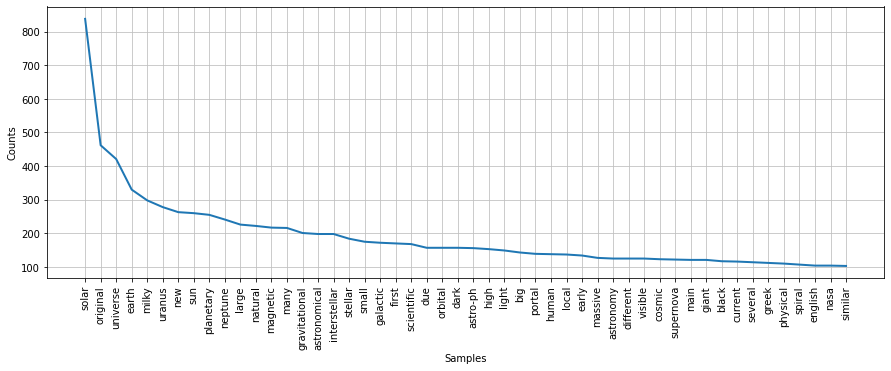

In [156]:
plt.figure(figsize=(15, 5))
fd = nltk.FreqDist(adjnouns)
fd.plot(50,cumulative=False)

In [167]:
from collections import Counter

counts1 = Counter(nouns)
print(counts1)
counts2 = Counter(pnouns)
print(counts2)
counts3 = Counter(adjnouns)
print(counts3)

Counter({'system': 762, 'earth': 724, 'space': 605, 'moon': 568, 'planet': 545, 'star': 526, 'science': 510, 'sun': 496, 'way': 454, 'b': 419, 'energy': 348, 'mass': 346, 'surface': 338, 'water': 295, 'life': 286, 'orbit': 267, 'matter': 256, 'core': 250, 'time': 244, 'venus': 242, 'galaxy': 236, 'field': 211, 'saturn': 205, 'history': 197, 'formation': 197, 'temperature': 195, 'rotation': 193, 'period': 191, 'distance': 180, 'cloud': 173, 'pmid': 169, 'gas': 168, 'jupiter': 168, 'hydrogen': 161, 'radiation': 159, 'c': 152, 'mercury': 150, 'astronomy': 147, 'helium': 147, 'model': 144, 'mission': 143, 'gravity': 142, 'edit': 141, 'disk': 140, 'structure': 139, 'size': 139, 'dust': 137, 'type': 136, 'century': 134, 'universe': 131, 'density': 128, 'world': 127, 'evolution': 127, 'dwarf': 126, 'center': 125, 'motion': 124, 'supernovae': 124, 'evidence': 123, 'lunar': 123, 'nature': 122, 'ice': 120, 'discovery': 119, 'theory': 119, 'telescope': 119, 'university': 116, 'number': 115, 'regi

In [182]:
from collections import Counter

final = []
for noun in nouns:
  final.append(noun)
for word in pnouns:
  final.append(word)
for word in adjnouns:
  final.append(word)

# removing wiki related junk words
stopwords =['a', 'b', 'c', 'd', 'e', 'articles', 'pmid']
for word in list(final):  
  if word in stopwords:
      final.remove(word)

counts = Counter(final)
final = counts.most_common(50)

mylist = []
print("Final List of words according to their importance: ")
for key, value in final:
  print(key)
  mylist.append(key)

output=('\n').join(mylist)

f = open("output.txt", "w")
f.write(output)
f.close()

Final List of words according to their importance: 
earth
solar
system
sun
stars
mars
planet
space
moon
planets
star
universe
science
original
way
galaxies
mass
venus
surface
energy
uranus
milky
galaxy
years
neptune
orbit
water
life
objects
astronomy
new
planetary
matter
saturn
core
time
supernova
dwarf
large
natural
light
dark
magnetic
many
field
lunar
temperature
formation
gravitational
jupiter


## Word cloud visualisation

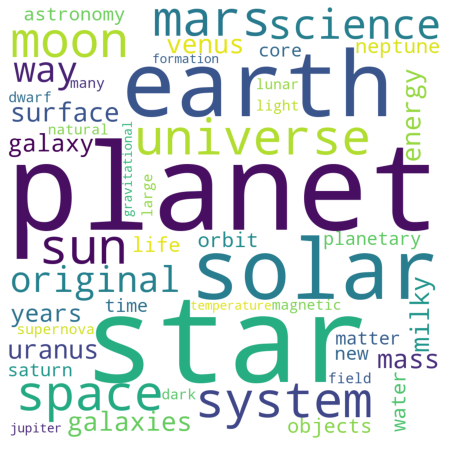

In [176]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

#convert list to string and generate
unique_string=(" ").join(mylist)
wordcloud = WordCloud(max_words= 75, width = 1000, height = 1000, background_color ='white').generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("word cloud"+".png", bbox_inches='tight')
plt.show()
plt.close()